In [4]:
# Importing the necessary libraries

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sqlalchemy import create_engine, text # importing the SQL interface

In [5]:
# creating an engine for the database

engine = create_engine('sqlite:///Maji_Ndogo_farm_survey_small.db')

In [6]:
# checking if the connection works for the engine created

with engine.connect() as connection:
    result  = connection.execute(text("SELECT name FROM sqlite_master WHERE type = 'table';"))
    
    for row in result:
        print(row)

('geographic_features',)
('weather_features',)
('soil_and_crop_features',)
('farm_management_features',)


In [7]:
# joining the tables and creating a dataframe

s_q = """
SELECT *
FROM geographic_features
LEFT JOIN weather_features USING (Field_ID)
LEFT JOIN soil_and_crop_features USING (Field_ID)
LEFT JOIN farm_management_features USING (Field_ID)
"""

with engine.connect() as connection:
    
    tt = pd.read_sql_query(text(s_q), connection)

In [8]:
tt

,Field_ID,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Crop_type,Annual_yield,Standard_yield
0,40734,786.05580,-7.389911,-7.556202,Rural_Akatsi,14.795113,1125.2,-3.1,33.1,15.00,0.62,Sandy,6.169393,8.526684e-02,1.3,0.751354,cassava,0.577964
1,30629,674.33410,-7.736849,-1.051539,Rural_Sokoto,11.374611,1450.7,-3.9,30.6,13.35,0.64,Volcanic,5.676648,3.996838e-01,2.2,1.069865,cassava,0.486302
2,39924,826.53390,-9.926616,0.115156,Rural_Sokoto,11.339692,2208.9,-1.8,28.4,13.30,0.69,Volcanic,5.331993,3.580286e-01,3.4,2.208801,tea,0.649647
3,5754,574.94617,-2.420131,-6.592215,Rural_Kilimani,7.109855,328.8,-5.8,32.2,13.20,0.54,Loamy,5.328150,2.866871e-01,2.4,1.277635,cassava,0.532348
4,14146,886.35300,-3.055434,-7.952609,Rural_Kilimani,55.007656,785.2,-2.5,31.0,14.25,0.72,Sandy,5.721234,4.319027e-02,1.5,0.832614,wheat,0.555076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5649,11472,681.36145,-7.358371,-6.254369,Rural_Akatsi,16.213196,885.7,-4.3,33.4,14.55,0.61,Sandy,5.741063,3.286828e-01,1.1,0.609930,potato,0.554482
5650,19660,667.02120,-3.154559,-4.475046,Rural_Kilimani,2.397553,501.1,-4.8,32.1,13.65,0.54,Sandy,5.445833,1.602583e-01,8.7,3.812289,maize,0.438194
5651,41296,670.77900,-14.472861,-6.110221,Rural_Hawassa,7.636470,1586.6,-3.8,33.4,14.80,0.64,Volcanic,5.385873,8.221326e-09,2.1,1.681629,tea,0.800776
5652,33090,429.48840,-14.653089,-6.984116,Rural_Hawassa,13.944720,1272.2,-6.2,34.6,14.20,0.63,Silt,5.562508,6.917245e-10,1.3,0.659874,cassava,0.507595


In [9]:
# checking for null values

mis = tt.isnull().sum()
mis

Field_ID             0
Elevation            0
Latitude             0
Longitude            0
Location             0
Slope                0
Rainfall             0
Min_temperature_C    0
Max_temperature_C    0
Ave_temps            0
Soil_fertility       0
Soil_type            0
pH                   0
Pollution_level      0
Plot_size            0
Crop_type            0
Annual_yield         0
Standard_yield       0
dtype: int64

In [10]:
# Checking for duplicates

dty = tt[tt.duplicated()]
dty

,Field_ID,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Crop_type,Annual_yield,Standard_yield


In [11]:
# confirming the data types are correct

tyd = tt.dtypes
tyd

Field_ID               int64
Elevation            float64
Latitude             float64
Longitude            float64
Location              object
Slope                float64
Rainfall             float64
Min_temperature_C    float64
Max_temperature_C    float64
Ave_temps            float64
Soil_fertility       float64
Soil_type             object
pH                   float64
Pollution_level      float64
Plot_size            float64
Crop_type            float64
Annual_yield          object
Standard_yield       float64
dtype: object

In [12]:
# naming the columns correctly
# using absolute values in the elevation column


tt.rename(columns={'Annual_yield':'Crop_type', 'Crop_type':'Annual_yield'}, inplace=True)
tt['Elevation'] = tt['Elevation'].abs()
tt.head(5)

,Field_ID,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Annual_yield,Crop_type,Standard_yield
0,40734,786.05580,-7.389911,-7.556202,Rural_Akatsi,14.795113,1125.2,-3.1,33.1,15.00,0.62,Sandy,6.169393,0.085267,1.3,0.751354,cassava,0.577964
1,30629,674.33410,-7.736849,-1.051539,Rural_Sokoto,11.374611,1450.7,-3.9,30.6,13.35,0.64,Volcanic,5.676648,0.399684,2.2,1.069865,cassava,0.486302
2,39924,826.53390,-9.926616,0.115156,Rural_Sokoto,11.339692,2208.9,-1.8,28.4,13.30,0.69,Volcanic,5.331993,0.358029,3.4,2.208801,tea,0.649647
3,5754,574.94617,-2.420131,-6.592215,Rural_Kilimani,7.109855,328.8,-5.8,32.2,13.20,0.54,Loamy,5.328150,0.286687,2.4,1.277635,cassava,0.532348
4,14146,886.35300,-3.055434,-7.952609,Rural_Kilimani,55.007656,785.2,-2.5,31.0,14.25,0.72,Sandy,5.721234,0.043190,1.5,0.832614,wheat,0.555076


In [13]:
# checking for unique names in specific columns
# spelling mistakes can be gotten as well

un = pd.concat([tt['Location'], tt['Soil_type'], tt['Crop_type']])
ss = un.unique()
print(ss)

['Rural_Akatsi' 'Rural_Sokoto' 'Rural_Kilimani' 'Rural_Hawassa'
 'Rural_Amanzi' 'Sandy' 'Volcanic' 'Loamy' 'Silt' 'Peaty' 'Rocky'
 'cassava' 'tea' 'wheat' 'potato' 'banana' 'coffee' 'rice' 'maize'
 'wheat ' 'tea ' 'cassaval' 'wheatn' 'cassava ' 'teaa']


In [14]:
# isolating the column with errors for analysis

km = tt['Crop_type'].unique()
km

array(['cassava', 'tea', 'wheat', 'potato', 'banana', 'coffee', 'rice',
       'maize', 'wheat ', 'tea ', 'cassaval', 'wheatn', 'cassava ',
       'teaa'], dtype=object)

In [15]:
# removing the trailing whitespaces

tt['Crop_type'] = tt['Crop_type'].str.strip()

In [16]:
tt['Crop_type'].unique()

array(['cassava', 'tea', 'wheat', 'potato', 'banana', 'coffee', 'rice',
       'maize', 'cassaval', 'wheatn', 'teaa'], dtype=object)

In [17]:
# to correct the spelling mistakes

def cc(crop):
    bb = {
        'cassaval': 'cassava',
        'wheatn': 'wheat',
        'teaa': 'tea'
    }
    
    return bb.get(crop, crop) 

tt['Crop_type'] = tt['Crop_type'].apply(cc)

In [18]:
tt['Crop_type'].unique() 

# checking to see if corrections have been implemented

array(['cassava', 'tea', 'wheat', 'potato', 'banana', 'coffee', 'rice',
       'maize'], dtype=object)

In [19]:
tt

,Field_ID,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Annual_yield,Crop_type,Standard_yield
0,40734,786.05580,-7.389911,-7.556202,Rural_Akatsi,14.795113,1125.2,-3.1,33.1,15.00,0.62,Sandy,6.169393,8.526684e-02,1.3,0.751354,cassava,0.577964
1,30629,674.33410,-7.736849,-1.051539,Rural_Sokoto,11.374611,1450.7,-3.9,30.6,13.35,0.64,Volcanic,5.676648,3.996838e-01,2.2,1.069865,cassava,0.486302
2,39924,826.53390,-9.926616,0.115156,Rural_Sokoto,11.339692,2208.9,-1.8,28.4,13.30,0.69,Volcanic,5.331993,3.580286e-01,3.4,2.208801,tea,0.649647
3,5754,574.94617,-2.420131,-6.592215,Rural_Kilimani,7.109855,328.8,-5.8,32.2,13.20,0.54,Loamy,5.328150,2.866871e-01,2.4,1.277635,cassava,0.532348
4,14146,886.35300,-3.055434,-7.952609,Rural_Kilimani,55.007656,785.2,-2.5,31.0,14.25,0.72,Sandy,5.721234,4.319027e-02,1.5,0.832614,wheat,0.555076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5649,11472,681.36145,-7.358371,-6.254369,Rural_Akatsi,16.213196,885.7,-4.3,33.4,14.55,0.61,Sandy,5.741063,3.286828e-01,1.1,0.609930,potato,0.554482
5650,19660,667.02120,-3.154559,-4.475046,Rural_Kilimani,2.397553,501.1,-4.8,32.1,13.65,0.54,Sandy,5.445833,1.602583e-01,8.7,3.812289,maize,0.438194
5651,41296,670.77900,-14.472861,-6.110221,Rural_Hawassa,7.636470,1586.6,-3.8,33.4,14.80,0.64,Volcanic,5.385873,8.221326e-09,2.1,1.681629,tea,0.800776
5652,33090,429.48840,-14.653089,-6.984116,Rural_Hawassa,13.944720,1272.2,-6.2,34.6,14.20,0.63,Silt,5.562508,6.917245e-10,1.3,0.659874,cassava,0.507595


In [20]:
tt.info() #checking the summary of the data


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5654 entries, 0 to 5653
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Field_ID           5654 non-null   int64  
 1   Elevation          5654 non-null   float64
 2   Latitude           5654 non-null   float64
 3   Longitude          5654 non-null   float64
 4   Location           5654 non-null   object 
 5   Slope              5654 non-null   float64
 6   Rainfall           5654 non-null   float64
 7   Min_temperature_C  5654 non-null   float64
 8   Max_temperature_C  5654 non-null   float64
 9   Ave_temps          5654 non-null   float64
 10  Soil_fertility     5654 non-null   float64
 11  Soil_type          5654 non-null   object 
 12  pH                 5654 non-null   float64
 13  Pollution_level    5654 non-null   float64
 14  Plot_size          5654 non-null   float64
 15  Annual_yield       5654 non-null   float64
 16  Crop_type          5654 

In [21]:
tt.describe().T #looking at the descriptive statistics of our data

,count,mean,std,min,25%,50%,75%,max
Field_ID,5654.0,22632.733817,13133.762515,1.000000e+00,11463.250000,22615.500000,34077.750000,45153.000000
Elevation,5654.0,637.790709,173.573934,3.591080e+01,525.611413,663.058585,764.299550,1122.252100
Latitude,5654.0,-7.026330,3.515839,-1.500904e+01,-9.674298,-7.205178,-4.182984,0.260756
Longitude,5654.0,-4.365755,2.706603,-1.001572e+01,-6.708209,-4.463785,-2.015527,1.696276
Slope,5654.0,11.742669,9.540599,9.731625e-02,4.860120,9.104626,15.953242,79.865960
Rainfall,5654.0,1201.943244,499.782824,1.031000e+02,773.175000,1200.600000,1625.425000,2470.900000
Min_temperature_C,5654.0,-4.411956,1.534330,-9.700000e+00,-5.500000,-4.300000,-3.300000,-0.100000
Max_temperature_C,5654.0,30.857057,1.884682,2.450000e+01,29.600000,30.800000,32.100000,37.800000
Ave_temps,5654.0,13.222550,0.801636,1.025000e+01,12.700000,13.200000,13.750000,17.300000
Soil_fertility,5654.0,0.619308,0.044791,5.100000e-01,0.590000,0.620000,0.650000,0.820000


In [22]:
# isolating the data that will be used to create the visualizations

xx = tt.drop(columns=['Field_ID'])
xx = xx.select_dtypes('number')

xx

,Elevation,Latitude,Longitude,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,pH,Pollution_level,Plot_size,Annual_yield,Standard_yield
0,786.05580,-7.389911,-7.556202,14.795113,1125.2,-3.1,33.1,15.00,0.62,6.169393,8.526684e-02,1.3,0.751354,0.577964
1,674.33410,-7.736849,-1.051539,11.374611,1450.7,-3.9,30.6,13.35,0.64,5.676648,3.996838e-01,2.2,1.069865,0.486302
2,826.53390,-9.926616,0.115156,11.339692,2208.9,-1.8,28.4,13.30,0.69,5.331993,3.580286e-01,3.4,2.208801,0.649647
3,574.94617,-2.420131,-6.592215,7.109855,328.8,-5.8,32.2,13.20,0.54,5.328150,2.866871e-01,2.4,1.277635,0.532348
4,886.35300,-3.055434,-7.952609,55.007656,785.2,-2.5,31.0,14.25,0.72,5.721234,4.319027e-02,1.5,0.832614,0.555076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5649,681.36145,-7.358371,-6.254369,16.213196,885.7,-4.3,33.4,14.55,0.61,5.741063,3.286828e-01,1.1,0.609930,0.554482
5650,667.02120,-3.154559,-4.475046,2.397553,501.1,-4.8,32.1,13.65,0.54,5.445833,1.602583e-01,8.7,3.812289,0.438194
5651,670.77900,-14.472861,-6.110221,7.636470,1586.6,-3.8,33.4,14.80,0.64,5.385873,8.221326e-09,2.1,1.681629,0.800776
5652,429.48840,-14.653089,-6.984116,13.944720,1272.2,-6.2,34.6,14.20,0.63,5.562508,6.917245e-10,1.3,0.659874,0.507595


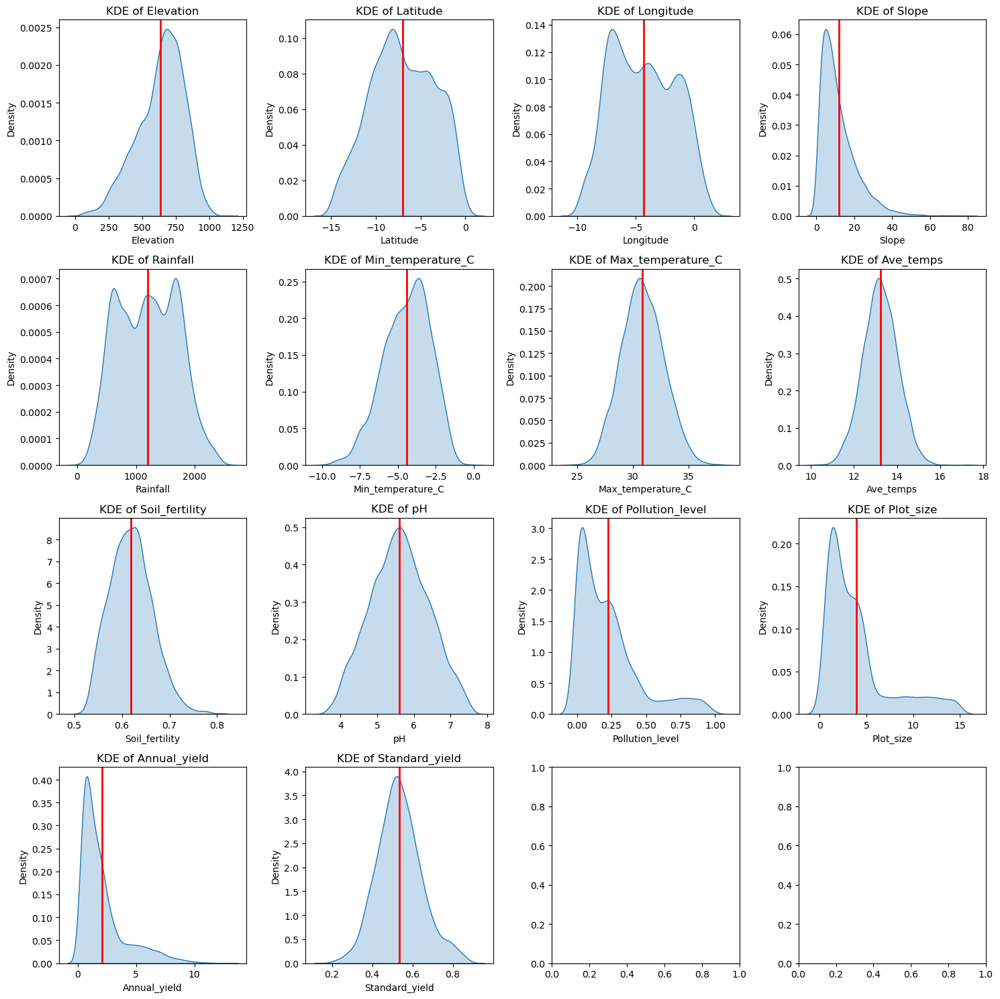

In [23]:
#creating a single image of KDE plots for each numerical column
fig, axes = plt.subplots(4, 4, figsize=(15, 15))  
axes = axes.flatten()  


for i, column in enumerate(xx.columns):
    
    sns.kdeplot(tt[column], fill=True, ax=axes[i])
    axes[i].set_title(f'KDE of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Density')
    
    mean_val = tt[column].mean()
    axes[i].axvline(mean_val, color='red', linestyle='solid', linewidth=2)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

<AxesSubplot:xlabel='Longitude', ylabel='Density'>

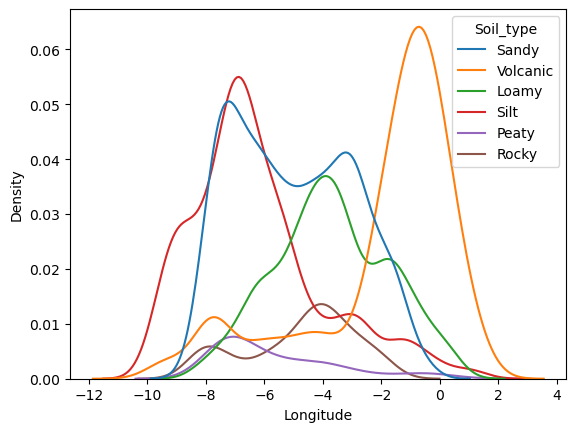

In [24]:

# Isolating some of the graphs for deeper analysis


sns.kdeplot(data = tt, x = 'Longitude', hue = 'Soil_type')

<AxesSubplot:xlabel='Annual_yield', ylabel='Density'>

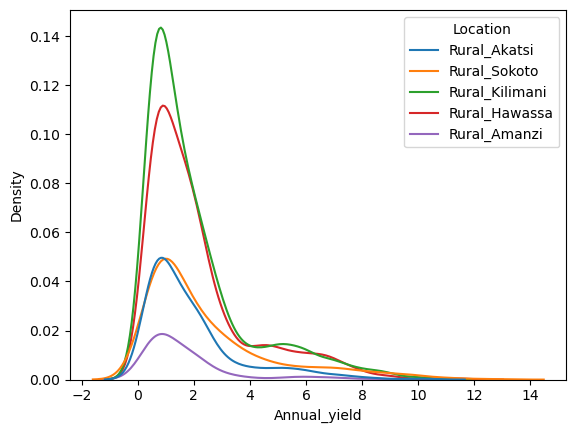

In [25]:
sns.kdeplot(data = tt, x = 'Annual_yield', hue = 'Location')

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

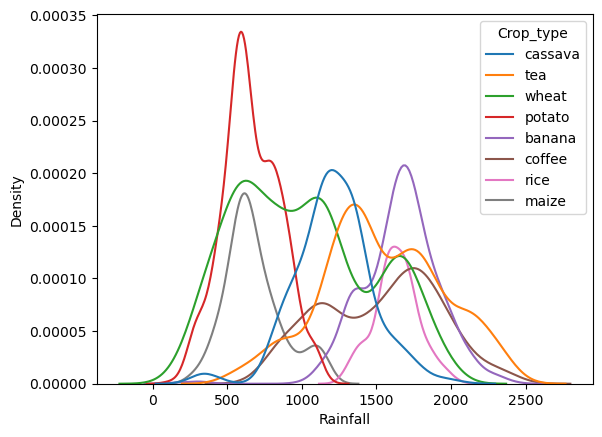

In [26]:
sns.kdeplot(data = tt, x = 'Rainfall', hue = 'Crop_type')

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

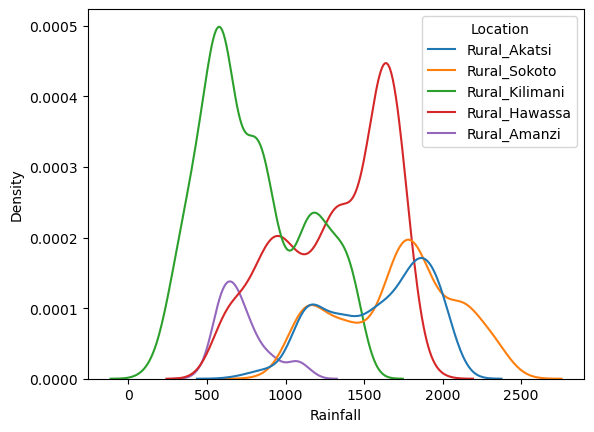

In [27]:
sns.kdeplot(data = tt, x = 'Rainfall', hue = 'Location')

In [28]:
# looking at the different locations and their average amount of rainfall

tt.groupby('Location').mean(numeric_only = True)['Rainfall']

Location
Rural_Akatsi      1584.884457
Rural_Amanzi       723.628958
Rural_Hawassa     1325.941003
Rural_Kilimani     791.352426
Rural_Sokoto      1705.079431
Name: Rainfall, dtype: float64

In [31]:
yy = tt.groupby('Location').mean(numeric_only = True)['Rainfall'].sort_values(ascending=False)

In [32]:
tx = pd.DataFrame(yy)

In [33]:
tx

,Rainfall
Location,
Rural_Sokoto,1705.079431
Rural_Akatsi,1584.884457
Rural_Hawassa,1325.941003
Rural_Kilimani,791.352426
Rural_Amanzi,723.628958


In [181]:
#looking at the crop that requires the highest average amount of rainfall alongside its other conditions

tt.groupby('Crop_type').max('Rainfall').sort_values('Rainfall', ascending=False)

,Field_ID,Elevation,Latitude,Longitude,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,pH,Pollution_level,Plot_size,Annual_yield,Standard_yield
Crop_type,,,,,,,,,,,,,,,
coffee,45128,1052.01970,-0.707968,1.353925,73.899100,2470.9,-0.6,35.8,15.70,0.78,7.499244,0.959006,14.9,8.658179,0.699556
tea,45143,1122.25210,-0.825116,1.696276,66.348976,2454.9,-0.1,35.7,16.20,0.82,6.208892,0.988964,15.0,12.695224,0.898037
banana,45153,872.41980,-0.397075,1.263833,42.261400,2408.5,-1.2,37.7,15.75,0.77,7.499959,0.978920,15.0,8.925619,0.669976
cassava,45119,1016.45730,-0.536752,1.371943,54.732290,2082.2,-1.2,37.1,17.30,0.81,7.469005,0.995413,15.0,9.098616,0.659977
rice,44905,681.22610,-5.736322,0.453002,40.120953,2048.9,-3.2,37.8,15.15,0.75,7.493580,0.851151,14.9,11.178225,0.833031
wheat,45108,1003.94370,0.139102,1.074639,79.865960,2044.5,-1.4,36.8,15.65,0.78,7.499745,0.989480,14.9,10.652870,0.741116
maize,44959,962.65515,0.260756,0.268313,72.578370,1202.5,-1.8,34.6,15.20,0.78,6.781301,0.928738,14.8,9.900485,0.711901
potato,45101,1024.26440,0.103057,0.187230,68.998290,1163.3,-1.2,35.9,15.45,0.76,6.776529,0.950349,14.9,9.879193,0.699493


In [37]:
# to check the maximum annual yield for each crop in the different pronvinces


xt = tt.groupby(['Location', 'Crop_type'])['Annual_yield'].sum()

In [38]:
xt = pd.DataFrame(xt)

In [39]:
xt

Annual_yield
Location       Crop_type              
Rural_Akatsi   banana       310.400883
               cassava      123.958841
               coffee       258.376041
               maize         15.927397
               potato        24.217827
               rice         182.706609
               tea          217.096887
               wheat        245.021253
Rural_Amanzi   cassava       23.154961
               coffee         7.521559
               maize         93.840437
               potato       178.777332
               tea           18.727185
               wheat        107.956083
Rural_Hawassa  banana       609.560924
               cassava      513.254120
               coffee       344.562324
               maize        179.826086
               potato       258.517996
               rice         474.065710
               tea          270.362061
               wheat       1025.806311
Rural_Kilimani banana        24.804906
               cassava      469.193891
               coffee       205.278620
               maize        485.070519
               potato      1153.369999
               tea          641.196066
               wheat       1101.684342
Rural_Sokoto   banana       320.316173
               cassava      164.895424
               coffee       371.508597
               maize         14.959342
               potato        46.685613
               rice           9.187405
               tea         1187.875289
               wheat        139.451253

<AxesSubplot:xlabel='Crop_type', ylabel='Rainfall'>

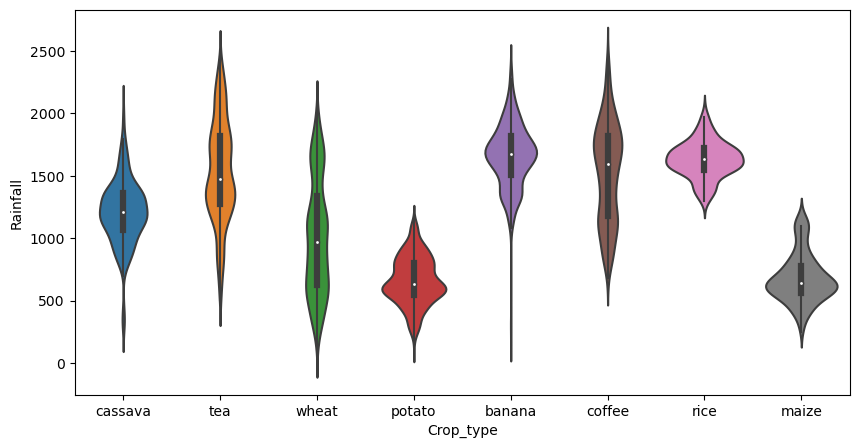

In [109]:
# checking the amount of rainfall each crop requires inorder to grow across different provinces

plt.figure(figsize = (10, 5))

sns.violinplot(data = tt, x = 'Crop_type', y = 'Rainfall')

In [110]:
tt

,Field_ID,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Annual_yield,Crop_type,Standard_yield
0,40734,786.05580,-7.389911,-7.556202,Rural_Akatsi,14.795113,1125.2,-3.1,33.1,15.00,0.62,Sandy,6.169393,8.526684e-02,1.3,0.751354,cassava,0.577964
1,30629,674.33410,-7.736849,-1.051539,Rural_Sokoto,11.374611,1450.7,-3.9,30.6,13.35,0.64,Volcanic,5.676648,3.996838e-01,2.2,1.069865,cassava,0.486302
2,39924,826.53390,-9.926616,0.115156,Rural_Sokoto,11.339692,2208.9,-1.8,28.4,13.30,0.69,Volcanic,5.331993,3.580286e-01,3.4,2.208801,tea,0.649647
3,5754,574.94617,-2.420131,-6.592215,Rural_Kilimani,7.109855,328.8,-5.8,32.2,13.20,0.54,Loamy,5.328150,2.866871e-01,2.4,1.277635,cassava,0.532348
4,14146,886.35300,-3.055434,-7.952609,Rural_Kilimani,55.007656,785.2,-2.5,31.0,14.25,0.72,Sandy,5.721234,4.319027e-02,1.5,0.832614,wheat,0.555076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5649,11472,681.36145,-7.358371,-6.254369,Rural_Akatsi,16.213196,885.7,-4.3,33.4,14.55,0.61,Sandy,5.741063,3.286828e-01,1.1,0.609930,potato,0.554482
5650,19660,667.02120,-3.154559,-4.475046,Rural_Kilimani,2.397553,501.1,-4.8,32.1,13.65,0.54,Sandy,5.445833,1.602583e-01,8.7,3.812289,maize,0.438194
5651,41296,670.77900,-14.472861,-6.110221,Rural_Hawassa,7.636470,1586.6,-3.8,33.4,14.80,0.64,Volcanic,5.385873,8.221326e-09,2.1,1.681629,tea,0.800776
5652,33090,429.48840,-14.653089,-6.984116,Rural_Hawassa,13.944720,1272.2,-6.2,34.6,14.20,0.63,Silt,5.562508,6.917245e-10,1.3,0.659874,cassava,0.507595


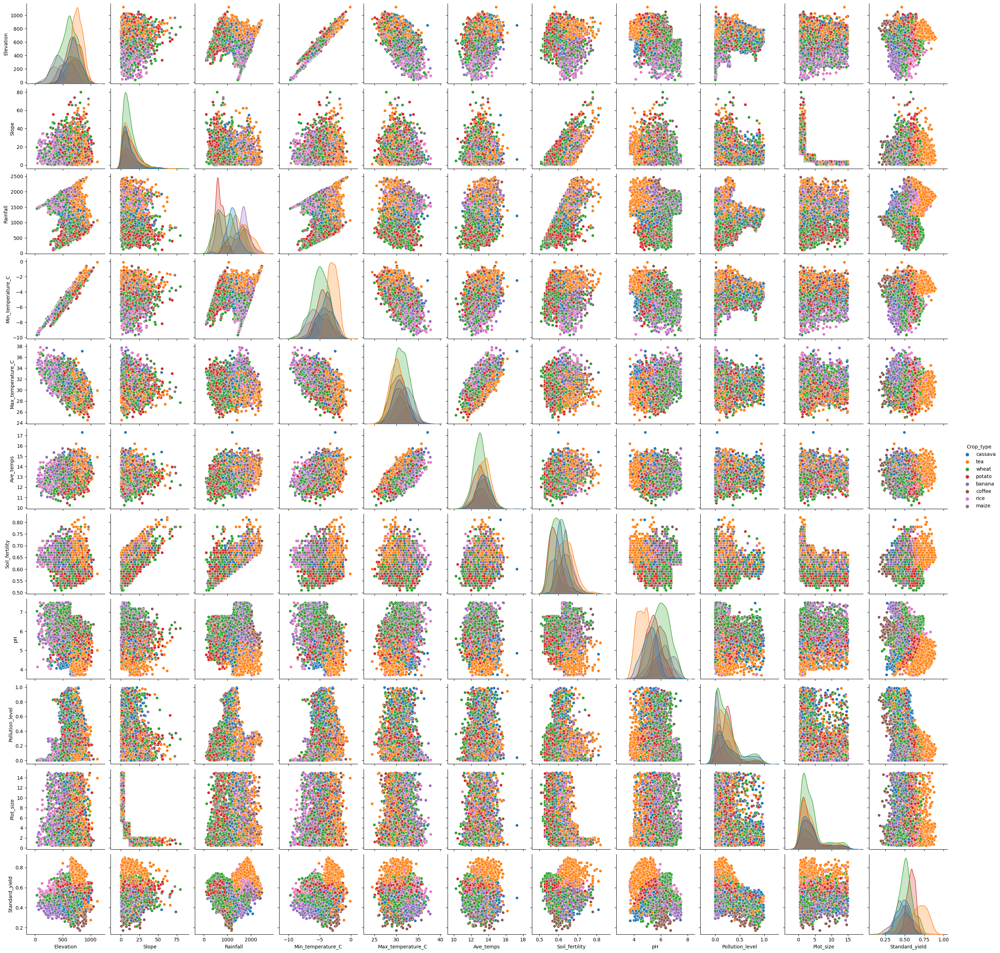

In [112]:
# Visualizing the data via a pairplot for analysis

pr = ['Field_ID', 'Latitude', 'Longitude', 'Annual_yield']

sns.pairplot(tt.drop(columns = pr), hue = "Crop_type")

In [119]:
# checking categorical relationships
# locations and the amount of crop yield

pd.crosstab(tt['Location'], tt['Crop_type'])

Crop_type,banana,cassava,coffee,maize,potato,rice,tea,wheat
Location,,,,,,,,
Rural_Akatsi,167,83,141,6,12,73,94,151
Rural_Amanzi,0,11,7,61,98,0,13,69
Rural_Hawassa,317,246,180,84,132,186,108,481
Rural_Kilimani,11,228,130,238,567,0,286,560
Rural_Sokoto,138,104,149,10,14,6,412,81


In [129]:
# looking at the location with the highest annual yield

total =tt.groupby('Location')['Annual_yield'].sum()

rt = pd.DataFrame(total)
rt

,Annual_yield
Location,
Rural_Akatsi,1377.705737
Rural_Amanzi,429.977557
Rural_Hawassa,3675.955532
Rural_Kilimani,4080.598342
Rural_Sokoto,2254.879096


In [130]:
# looking at the location with the highest standard yield

yt = tt.groupby('Location')['Standard_yield'].sum()

yy = pd.DataFrame(yt)
yy

,Standard_yield
Location,
Rural_Akatsi,380.057415
Rural_Amanzi,134.175599
Rural_Hawassa,894.415215
Rural_Kilimani,1075.022082
Rural_Sokoto,537.856224


In [134]:
# looking at what affects the standard yield

qq =tt.corr()['Standard_yield'].sort_values(ascending=False)

qq = pd.DataFrame(qq)
qq

,Standard_yield
Standard_yield,1.000000
Annual_yield,0.220812
Min_temperature_C,0.144233
Elevation,0.129248
Longitude,0.085343
Soil_fertility,0.070205
Latitude,0.061724
Slope,0.056991
Rainfall,0.039217
Field_ID,0.030802


<Figure size 1000x600 with 0 Axes>

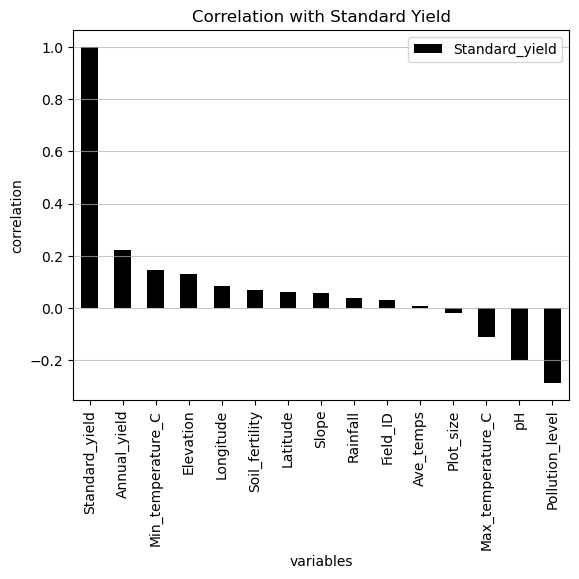

In [140]:
# to visualize the story we're telling

plt.figure(figsize = (10,6))
qq.plot(kind = 'bar', color = 'black')
plt.title('Correlation with Standard Yield')
plt.xlabel('variables')
plt.ylabel('correlation')

plt.grid(axis = 'y', linestyle = 'solid', alpha = 0.7)
plt.show()

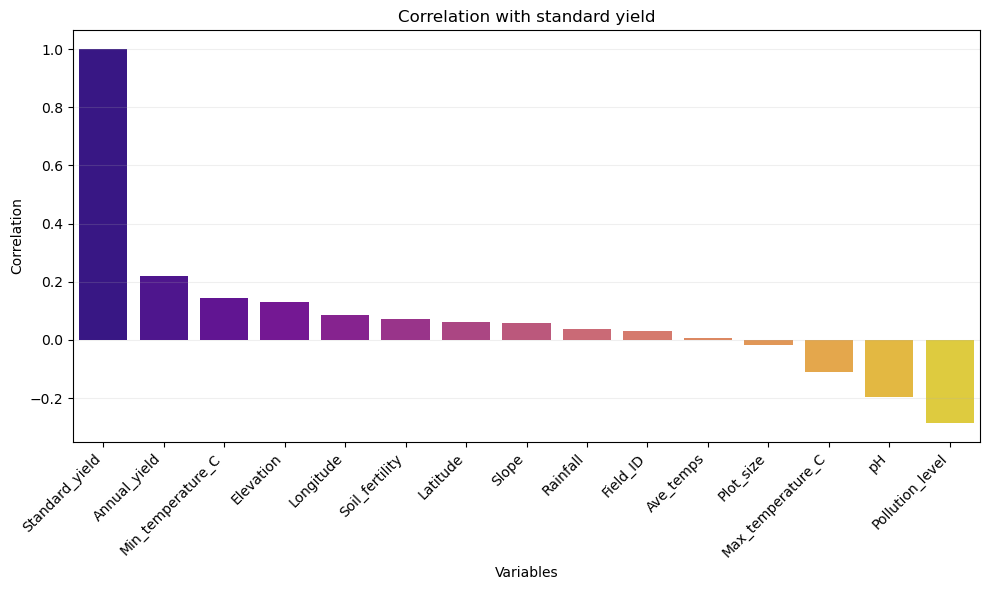

In [157]:
plt.figure(figsize = (10,6))

r = qq.values.flatten()

sns.barplot(x = qq.index, y = r, palette= 'plasma')
plt.title('Correlation with standard yield')
plt.xlabel('Variables')
plt.ylabel('Correlation')

plt.grid(axis = 'y', linestyle = 'solid', alpha = 0.2)
plt.xticks(rotation = 45, ha = 'right')

plt.tight_layout()
plt.show()

In [158]:
tt

,Field_ID,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Annual_yield,Crop_type,Standard_yield
0,40734,786.05580,-7.389911,-7.556202,Rural_Akatsi,14.795113,1125.2,-3.1,33.1,15.00,0.62,Sandy,6.169393,8.526684e-02,1.3,0.751354,cassava,0.577964
1,30629,674.33410,-7.736849,-1.051539,Rural_Sokoto,11.374611,1450.7,-3.9,30.6,13.35,0.64,Volcanic,5.676648,3.996838e-01,2.2,1.069865,cassava,0.486302
2,39924,826.53390,-9.926616,0.115156,Rural_Sokoto,11.339692,2208.9,-1.8,28.4,13.30,0.69,Volcanic,5.331993,3.580286e-01,3.4,2.208801,tea,0.649647
3,5754,574.94617,-2.420131,-6.592215,Rural_Kilimani,7.109855,328.8,-5.8,32.2,13.20,0.54,Loamy,5.328150,2.866871e-01,2.4,1.277635,cassava,0.532348
4,14146,886.35300,-3.055434,-7.952609,Rural_Kilimani,55.007656,785.2,-2.5,31.0,14.25,0.72,Sandy,5.721234,4.319027e-02,1.5,0.832614,wheat,0.555076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5649,11472,681.36145,-7.358371,-6.254369,Rural_Akatsi,16.213196,885.7,-4.3,33.4,14.55,0.61,Sandy,5.741063,3.286828e-01,1.1,0.609930,potato,0.554482
5650,19660,667.02120,-3.154559,-4.475046,Rural_Kilimani,2.397553,501.1,-4.8,32.1,13.65,0.54,Sandy,5.445833,1.602583e-01,8.7,3.812289,maize,0.438194
5651,41296,670.77900,-14.472861,-6.110221,Rural_Hawassa,7.636470,1586.6,-3.8,33.4,14.80,0.64,Volcanic,5.385873,8.221326e-09,2.1,1.681629,tea,0.800776
5652,33090,429.48840,-14.653089,-6.984116,Rural_Hawassa,13.944720,1272.2,-6.2,34.6,14.20,0.63,Silt,5.562508,6.917245e-10,1.3,0.659874,cassava,0.507595


In [160]:
# Analysing the coffee crop to see the conditions favouring its growth

cof = tt.query("Crop_type == 'coffee'")
cof = cof.drop(columns = ['Crop_type', 'Field_ID', 'Annual_yield'])

cof

,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Standard_yield
8,742.72180,-10.237509,-0.736216,Rural_Sokoto,3.431843,2143.3,-2.6,28.2,12.80,0.66,Volcanic,5.447321,0.278479,13.9,0.613861
10,756.92020,-7.538599,-0.578555,Rural_Sokoto,9.371509,1544.7,-3.1,30.5,13.70,0.64,Volcanic,5.831129,0.445129,3.2,0.473838
46,805.97516,-4.335051,-0.884868,Rural_Kilimani,4.799029,1284.1,-2.8,29.2,13.20,0.60,Volcanic,5.829747,0.800535,2.3,0.322042
60,909.26044,-1.433385,-1.862370,Rural_Kilimani,9.121588,1405.4,-1.8,31.0,14.60,0.63,Volcanic,5.366401,0.063129,2.7,0.447648
63,709.24520,-10.498839,-0.519995,Rural_Sokoto,1.262478,2156.5,-2.9,30.9,14.00,0.66,Volcanic,5.578642,0.339897,8.8,0.632110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5605,607.22230,-5.682253,-0.240709,Rural_Sokoto,19.527452,1168.3,-4.7,31.8,13.55,0.64,Loamy,6.069326,0.959006,1.5,0.279980
5614,597.53180,-9.665286,-0.159625,Rural_Sokoto,20.546371,1906.7,-4.1,30.5,13.20,0.70,Silt,5.919850,0.304689,0.8,0.473800
5620,776.97730,-3.591612,-1.884893,Rural_Kilimani,3.836709,1098.1,-3.2,28.7,12.75,0.59,Sandy,6.082702,0.495007,5.2,0.305074
5631,759.91650,-4.533302,-1.709213,Rural_Kilimani,11.699152,1074.5,-3.4,30.7,13.65,0.61,Sandy,6.696831,0.711877,2.8,0.243286


In [162]:
# looking at the average conditions that favor the growth of coffee in the different locations

cof = tt.query("Crop_type == 'coffee'")
cof = cof.drop(columns = ['Crop_type', 'Field_ID', 'Annual_yield'])

loc = cof.groupby('Location').mean()

loc = pd.DataFrame(loc)
loc


,Elevation,Latitude,Longitude,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,pH,Pollution_level,Plot_size,Standard_yield
Location,,,,,,,,,,,,,
Rural_Akatsi,548.132176,-10.316375,-8.321604,11.777326,1709.964539,-4.763830,31.694326,13.465248,0.657589,6.259349,0.076625,3.636879,0.505270
Rural_Amanzi,807.491400,-6.429555,-7.834202,19.953122,960.928571,-3.042857,29.771429,13.364286,0.625714,6.035341,0.258723,3.000000,0.357575
Rural_Hawassa,558.752292,-9.804187,-4.679180,10.723330,1467.896111,-4.880000,31.408889,13.264444,0.636056,6.256559,0.120226,4.063889,0.468297
Rural_Kilimani,807.063011,-3.372011,-2.176272,10.065818,1112.828462,-2.954615,29.666923,13.356154,0.607615,5.961721,0.384870,4.421538,0.360260
Rural_Sokoto,700.169759,-8.971833,-0.481509,9.501000,1814.291275,-3.285235,30.479866,13.597315,0.658523,5.760736,0.302223,4.758389,0.510256


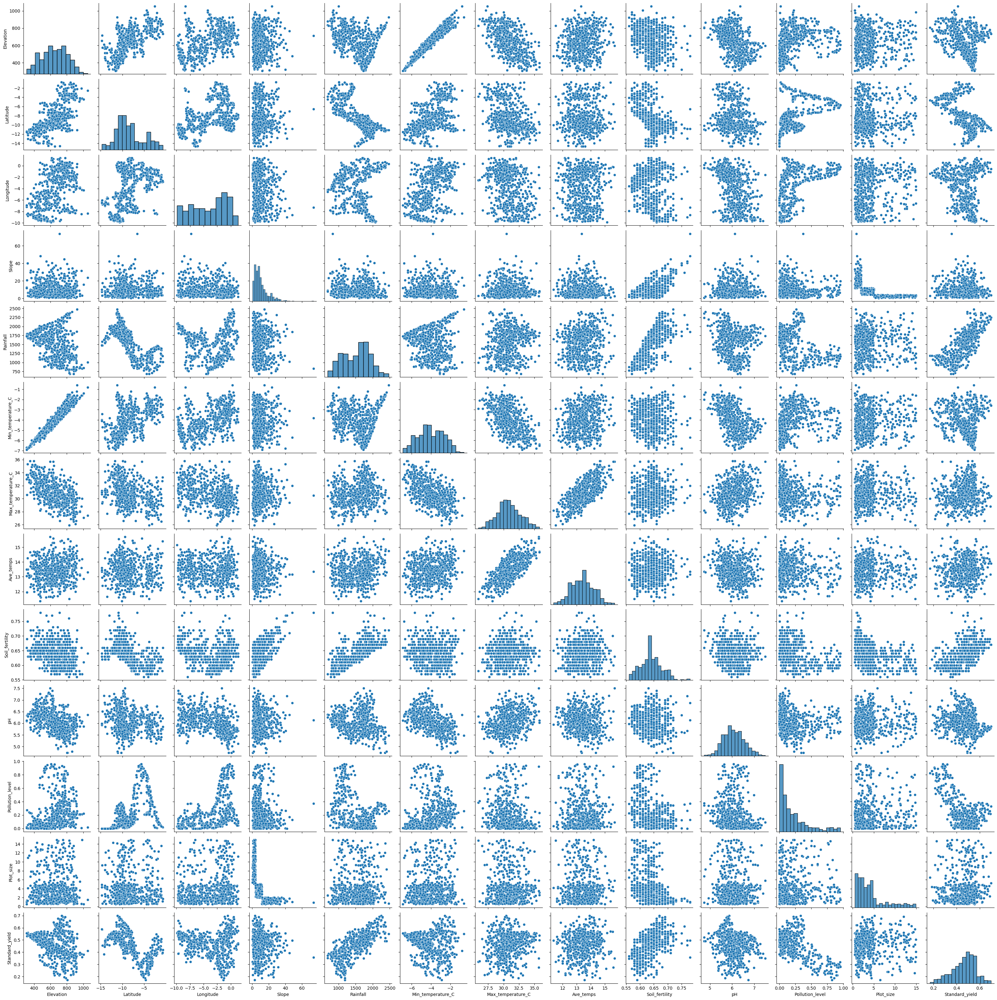

In [165]:
# checking for correlation with its variables

sns.pairplot(cof)

In [166]:
# looking at maize

mz = tt.query("Crop_type == 'maize'")
mz = mz.drop(columns = ['Crop_type', 'Field_ID', 'Annual_yield'])

mz = pd.DataFrame(mz)
mz

,Elevation,Latitude,Longitude,Location,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,Soil_type,pH,Pollution_level,Plot_size,Standard_yield
50,544.65480,-1.199089,-3.925483,Rural_Kilimani,9.845885,532.3,-5.9,33.4,13.75,0.56,Loamy,4.998229,0.026571,4.1,0.545837
55,813.84580,-4.898263,-5.556154,Rural_Kilimani,29.738115,562.4,-3.4,30.3,13.45,0.63,Sandy,6.060544,0.304448,0.7,0.535902
66,834.71590,-5.182121,-3.587637,Rural_Kilimani,18.581152,785.0,-3.0,29.2,13.10,0.61,Sandy,6.156582,0.196531,0.7,0.559225
70,545.20320,-0.406087,-3.002037,Rural_Kilimani,10.295476,772.7,-5.6,29.1,11.75,0.58,Loamy,6.724823,0.006578,3.3,0.663919
100,711.88837,-7.601679,-4.024585,Rural_Hawassa,1.712716,1046.3,-3.9,31.4,13.75,0.58,Sandy,6.586034,0.069158,5.2,0.504117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5576,806.86500,-6.371624,-8.006664,Rural_Amanzi,4.477505,951.0,-3.1,30.6,13.75,0.58,Sandy,6.572876,0.236452,3.7,0.518253
5593,678.63270,-2.510245,-7.254393,Rural_Kilimani,6.871345,483.1,-4.7,29.9,12.60,0.55,Sandy,6.141379,0.115678,4.3,0.525987
5616,638.51290,-2.631899,-4.655231,Rural_Kilimani,16.675251,465.4,-5.1,32.1,13.50,0.58,Sandy,5.658775,0.128115,1.3,0.455845
5646,589.28860,-4.519784,-7.713864,Rural_Kilimani,33.468243,464.5,-5.5,32.4,13.45,0.63,Loamy,5.911776,0.329639,1.0,0.593583


In [167]:
# looking at the average conditions needed for the growth of maize in the different locations

zm = mz.groupby('Location').mean()
zm = pd.DataFrame(zm)
zm

,Elevation,Latitude,Longitude,Slope,Rainfall,Min_temperature_C,Max_temperature_C,Ave_temps,Soil_fertility,pH,Pollution_level,Plot_size,Standard_yield
Location,,,,,,,,,,,,,
Rural_Akatsi,681.808490,-7.638475,-6.902283,7.349429,1035.016667,-4.166667,31.350000,13.591667,0.593333,6.417794,0.166204,4.883333,0.509313
Rural_Amanzi,701.253941,-5.890697,-7.344190,13.037174,679.208197,-4.309836,30.367213,13.028689,0.583934,5.776383,0.369102,3.042623,0.486917
Rural_Hawassa,621.825601,-6.742700,-3.879686,10.531632,798.250000,-4.927381,30.692857,12.882738,0.584881,6.070507,0.284732,3.923810,0.541669
Rural_Kilimani,703.109910,-3.137351,-4.797789,13.283974,613.359244,-4.355042,30.507563,13.076261,0.580000,5.953511,0.198725,3.801681,0.541476
Rural_Sokoto,511.734526,-6.819040,-1.052440,10.738915,1104.880000,-5.640000,32.060000,13.210000,0.608000,6.436855,0.711295,3.130000,0.478722


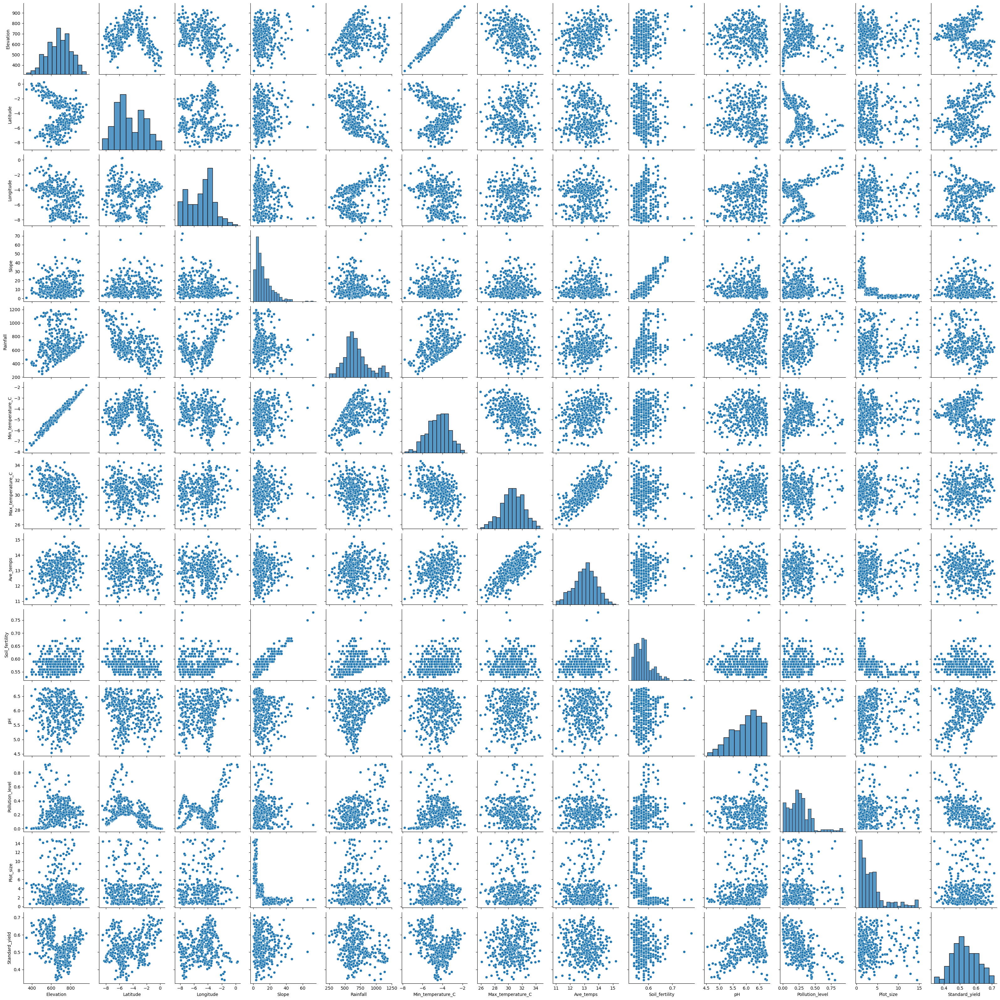

In [174]:
# checking for correlation with its variables

sns.pairplot(mz)